In [ ]:
# figure

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
from collections import Counter
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams["font.sans-serif"] = "Arial"
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=80, dpi_save=300, figsize=(12, 12))
%config InlineBackend.figure_format = 'retina'
import os
from scipy.io import mmread
from os.path import join, exists, split
from os import listdir
from typing import Union
import re
from scipy import stats
sc.settings.n_jobs=8

In [2]:
import harmonypy

## Step1: Load Datasets 

In [48]:
#c = sc.read_10x_mtx('D:/R/data/c/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 

In [3]:
sap1 = sc.read_10x_mtx('D:/R/data/SAP1/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap2 = sc.read_10x_mtx('D:/R/data/SAP2/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap3 = sc.read_10x_mtx('D:/R/data/SAP3/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap4 = sc.read_10x_mtx('D:/R/data/SAP4/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap5 = sc.read_10x_mtx('D:/R/data/SAP5/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap6 = sc.read_10x_mtx('D:/R/data/SAP6/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
sap7 = sc.read_10x_mtx('D:/R/data/SAP7/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True)

In [4]:
c1 = sc.read_10x_mtx('D:/R/data/C1/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c2 = sc.read_10x_mtx('D:/R/data/C2/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c3 = sc.read_10x_mtx('D:/R/data/C3/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c4 = sc.read_10x_mtx('D:/R/data/C4/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c5 = sc.read_10x_mtx('D:/R/data/C5/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c6 = sc.read_10x_mtx('D:/R/data/C6/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 
c7 = sc.read_10x_mtx('D:/R/data/C7/filtered_feature_bc_matrix/',var_names='gene_symbols',cache=True) 

In [16]:
c5

AnnData object with n_obs × n_vars = 7999 × 36601
    var: 'gene_ids'

In [18]:
c7

AnnData object with n_obs × n_vars = 9698 × 36601
    var: 'gene_ids'

In [51]:
datasets = [sap1,sap2,sap3,sap4,sap5,sap6,sap7,c1,c2,c3,c4,c5,c6,c7]

In [52]:
for dataset in datasets:
    dataset.var_names_make_unique()
    sc.pp.filter_cells(dataset, min_genes=200)
    sc.pp.filter_genes(dataset, min_cells=3)

In [53]:
integrated = sap1.concatenate([sap2,sap3,sap4,sap5,sap6,sap7,c1,c2,c3,c4,c5,c6,c7],index_unique='_',batch_categories=['sap1','sap2','sap3','sap4','sap5',
        'sap6','sap7','c1','c2','c3','c4','c5','c6','c7'])

In [54]:
integrated.var['mt'] = integrated.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(integrated, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

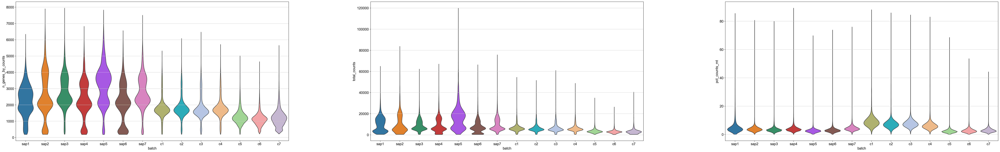

In [55]:
sc.settings.set_figure_params(dpi=100, figsize=(15, 10))
sc.pl.violin(integrated, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],groupby='batch',size=0,ncols=1)

In [56]:
integrated = integrated[integrated.obs.n_genes_by_counts > 500, :]
integrated = integrated[integrated.obs.n_genes_by_counts < 6000, :]
integrated = integrated[integrated.obs.pct_counts_mt < 20, :]

In [74]:
integrated.obs.batch.value_counts()

sap7    9377
sap1    8931
sap3    8412
c7      8393
c6      8332
c5      7465
c4      7174
sap4    6675
sap6    6539
sap2    6427
c3      5554
c2      4888
sap5    3936
c1      2735
Name: batch, dtype: int64

## Step2: Filter blacklist genes (TCR genes IG genes and Ribosome genes )

In [58]:
blacklist_genes = pd.read_csv('D:/R/data/blacklist_genes.csv',
                              index_col=-1)
blacklist_genes = blacklist_genes.index.to_list()

In [59]:
#去除染色体基因
#hg38_gene_position = pd.read_csv('D:/R/data/hg38_gen_pos.filtered.deduplicates.txt', header=None, sep='\t')
#hg38_gene_position.columns = ['gene', 'chr', 'start', 'end']
#X_Y_genes = hg38_gene_position[hg38_gene_position.chr.isin(['chrX', 'chrY'])].gene.values
#blacklist_genes = np.concatenate((blacklist_genes, X_Y_genes, ['MALAT1']))

In [60]:
def ribogenes(x):
    if(re.search("^RP([0-9]+-|[LS])", x)):
        return(True)
    else:
        return(False)

In [61]:
integrated.var['ribo_genes'] = list(map(lambda x:ribogenes(x),integrated.var_names))

In [62]:
rmRP_genes = integrated.var.loc[integrated.var.ribo_genes==False].index.to_list()
clean_genes = [i for i in rmRP_genes if i not in blacklist_genes]

In [63]:
integrated = integrated[:, clean_genes]

In [64]:
integrated.obs

,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt
AAACCCAAGTGAGTGC-1_sap1,1903,sap1,1825,6102.0,238.0,3.900361
AAACCCACACAACGTT-1_sap1,3932,sap1,3741,15701.0,419.0,2.668620
AAACCCACACAGCGCT-1_sap1,1537,sap1,1467,6268.0,277.0,4.419272
AAACCCACACGACGCT-1_sap1,2995,sap1,2848,18663.0,636.0,3.407812
AAACCCAGTGGTTCTA-1_sap1,2407,sap1,2279,10623.0,392.0,3.690106
...,...,...,...,...,...,...
TTTGTCAGTTACCAGT-1_c7,1026,c7,1004,2049.0,52.0,2.537823
TTTGTCATCCAATGGT-1_c7,950,c7,927,2562.0,81.0,3.161592
TTTGTCATCCATTCTA-1_c7,850,c7,828,1976.0,103.0,5.212551
TTTGTCATCCTCTAGC-1_c7,1808,c7,1766,5111.0,88.0,1.721777


## Step3: Filter cell doublets

In [65]:
cell_doublets = pd.read_csv('D:/R/cell_doublets_info_8.14.csv',index_col=0)

In [66]:
cell_doublets

,n_genes,doublet,doublet_score
AAACCCAAGTGAGTGC-1_sap1,1903,0.0,1.083160e-06
AAACCCACACAACGTT-1_sap1,3932,1.0,2.970674e+02
AAACCCACACAGCGCT-1_sap1,1537,0.0,3.561748e-12
AAACCCACACGACGCT-1_sap1,2995,0.0,1.597788e-05
AAACCCAGTAGATTAG-1_sap1,397,0.0,1.035311e-11
...,...,...,...
TTTGTCAGTTACCAGT-1_c7,1026,0.0,6.682025e-06
TTTGTCATCCAATGGT-1_c7,950,0.0,1.594264e-11
TTTGTCATCCATTCTA-1_c7,850,0.0,3.873872e-09
TTTGTCATCCTCTAGC-1_c7,1808,0.0,5.200847e-02


In [67]:
integrated.obs['doublet'] = [str(int(i)) for i in cell_doublets.loc[integrated.obs.index]['doublet'].to_list()]
integrated.obs['doublet_score'] =cell_doublets.loc[integrated.obs.index]['doublet_score']

In [68]:
integrated.obs

,n_genes,batch,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,doublet,doublet_score
AAACCCAAGTGAGTGC-1_sap1,1903,sap1,1825,6102.0,238.0,3.900361,0,1.083160e-06
AAACCCACACAACGTT-1_sap1,3932,sap1,3741,15701.0,419.0,2.668620,1,2.970674e+02
AAACCCACACAGCGCT-1_sap1,1537,sap1,1467,6268.0,277.0,4.419272,0,3.561748e-12
AAACCCACACGACGCT-1_sap1,2995,sap1,2848,18663.0,636.0,3.407812,0,1.597788e-05
AAACCCAGTGGTTCTA-1_sap1,2407,sap1,2279,10623.0,392.0,3.690106,0,8.066709e-06
...,...,...,...,...,...,...,...,...
TTTGTCAGTTACCAGT-1_c7,1026,c7,1004,2049.0,52.0,2.537823,0,6.682025e-06
TTTGTCATCCAATGGT-1_c7,950,c7,927,2562.0,81.0,3.161592,0,1.594264e-11
TTTGTCATCCATTCTA-1_c7,850,c7,828,1976.0,103.0,5.212551,0,3.873872e-09
TTTGTCATCCTCTAGC-1_c7,1808,c7,1766,5111.0,88.0,1.721777,0,5.200847e-02


In [69]:
integrated = integrated[integrated.obs.loc[integrated.obs.doublet=='0'].index,]

In [70]:
integrated.shape

(94838, 13886)

In [71]:
integrated.write('../integrated_rmGenes_rmDoublets_20220814.h5ad')

## Step4: process scRNA-seq Data

In [72]:
sc.pp.normalize_total(integrated, target_sum=1e4)
sc.pp.log1p(integrated)
sc.pp.highly_variable_genes(integrated,n_top_genes=2500)
integrated.raw = integrated
integrated = integrated[:, integrated.var.highly_variable]

In [73]:
sc.pp.regress_out(integrated, ['total_counts', 'pct_counts_mt'])

MemoryError: Unable to allocate 2.17 MiB for an array with shape (94838, 3) and data type float64

In [ ]:
sc.pp.scale(integrated, max_value=10)

In [ ]:
sc.tl.pca(integrated, svd_solver='arpack')

In [ ]:
sc.pp.neighbors(integrated, n_neighbors=10, n_pcs=30)

In [ ]:
sc.tl.umap(integrated)

In [ ]:
sc.settings.set_figure_params(dpi=100, figsize=(5, 5))
sc.pl.umap(integrated,color=['batch'])

In [ ]:
def sampletype(x):
    if 'sap' in x:
        return('sap')
    elif 'c' in x:
        return('control')

In [ ]:
integrated.obs['condition'] = list(map(lambda x :sampletype(x),integrated.obs['batch']))

In [ ]:
sc.settings.set_figure_params(dpi=100, figsize=(5, 5))
sc.pl.umap(integrated,color=['condition'])

## Step5: Harmony remove batch

In [37]:
sc.external.pp.harmony_integrate(integrated, 
                                 key=['condition','batch'],  
                                 basis='X_pca', adjusted_basis='X_pca_harmony', 
                                     lamb=None, max_iter_harmony=10)

2022-08-14 03:18:50,503 - harmonypy - INFO - Iteration 1 of 10
2022-08-14 03:19:39,663 - harmonypy - INFO - Iteration 2 of 10
2022-08-14 03:20:28,498 - harmonypy - INFO - Iteration 3 of 10
2022-08-14 03:21:16,170 - harmonypy - INFO - Iteration 4 of 10
2022-08-14 03:22:03,611 - harmonypy - INFO - Iteration 5 of 10
2022-08-14 03:22:52,979 - harmonypy - INFO - Iteration 6 of 10
2022-08-14 03:23:41,532 - harmonypy - INFO - Iteration 7 of 10
2022-08-14 03:24:13,896 - harmonypy - INFO - Iteration 8 of 10
2022-08-14 03:24:43,038 - harmonypy - INFO - Iteration 9 of 10
2022-08-14 03:25:31,747 - harmonypy - INFO - Iteration 10 of 10
2022-08-14 03:26:01,632 - harmonypy - INFO - Stopped before convergence


In [38]:
sc.pp.neighbors(integrated, n_neighbors=15, use_rep='X_pca_harmony')
sc.tl.umap(integrated)

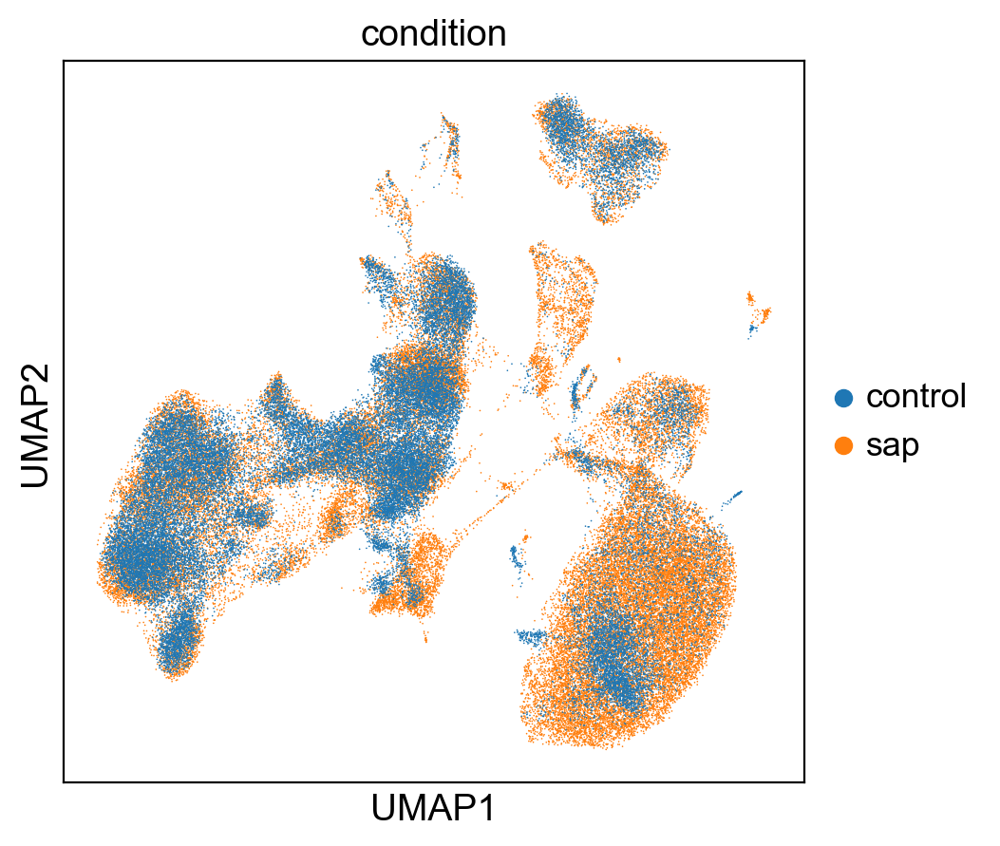

In [40]:
sc.settings.set_figure_params(dpi=100, figsize=(5, 5))
sc.pl.umap(integrated,color=['condition'])

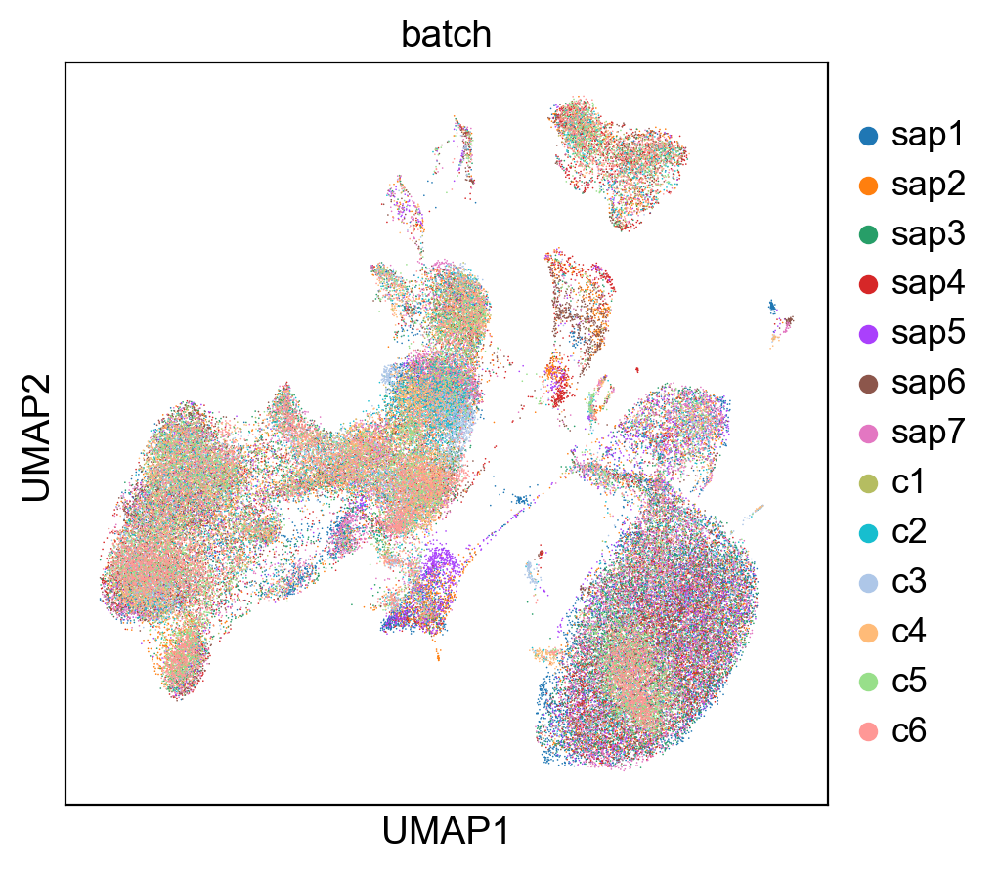

In [41]:
sc.settings.set_figure_params(dpi=100, figsize=(5, 5))
sc.pl.umap(integrated,color=['batch'],save='UMAP2.png')

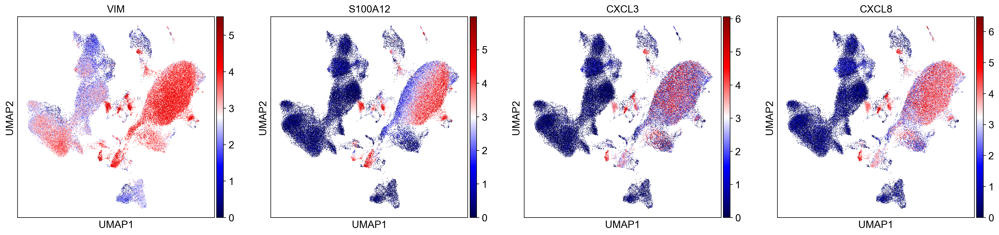

In [135]:
sc.settings.set_figure_params(dpi=100, figsize=(5, 5))
sc.pl.umap(integrated,color=['VIM','S100A12','CXCL3','CXCL8'],cmap='seismic')

In [221]:
deg_data['18_n'][0:50]

0        NAMPT
1        CSF3R
2     SLC25A37
3       FCGR3B
4        NEAT1
5       IFITM2
6        LITAF
7        BASP1
8        LIMK2
9         SOD2
10        FPR1
11        G0S2
12        SRGN
13     S100A11
14        SAT1
15        AQP9
16        PLEK
17      S100A8
18      KCNJ15
19       PROK2
20       DUSP1
21        MXD1
22         GCA
23         FOS
24    ARHGAP26
25        MCL1
26       H3F3A
27        MNDA
28        NCF1
29      CYSTM1
30       SORL1
31        DYSF
32        FTH1
33       ZFP36
34      RNF149
35       SDCBP
36     ALDH1A2
37       RBM47
38       NABP1
39        NUMB
40        LCP1
41        MGAM
42       CXCR2
43      TECPR2
44       CMTM2
45      S100A9
46     RABGEF1
47      PLXNC1
48      BCL2A1
49      FNDC3B
Name: 18_n, dtype: object

In [140]:
deg_data['3_n'][0:30]

0         LYZ
1        FCN1
2      MS4A6A
3        CPVL
4        CD14
5        CTSS
6       IFI30
7        CST3
8        CSTA
9        TYMP
10      FCGRT
11     LGALS3
12       VCAN
13      BLVRB
14        GRN
15       MNDA
16       CYBB
17       NCF2
18       AIF1
19    TNFAIP2
20       SRGN
21      CEBPD
22     S100A9
23        CFD
24      ALDH2
25       FPR1
26        TKT
27       SPI1
28       PSAP
29     CLEC7A
Name: 3_n, dtype: object

In [42]:
sc.tl.leiden(integrated,resolution=0.5)

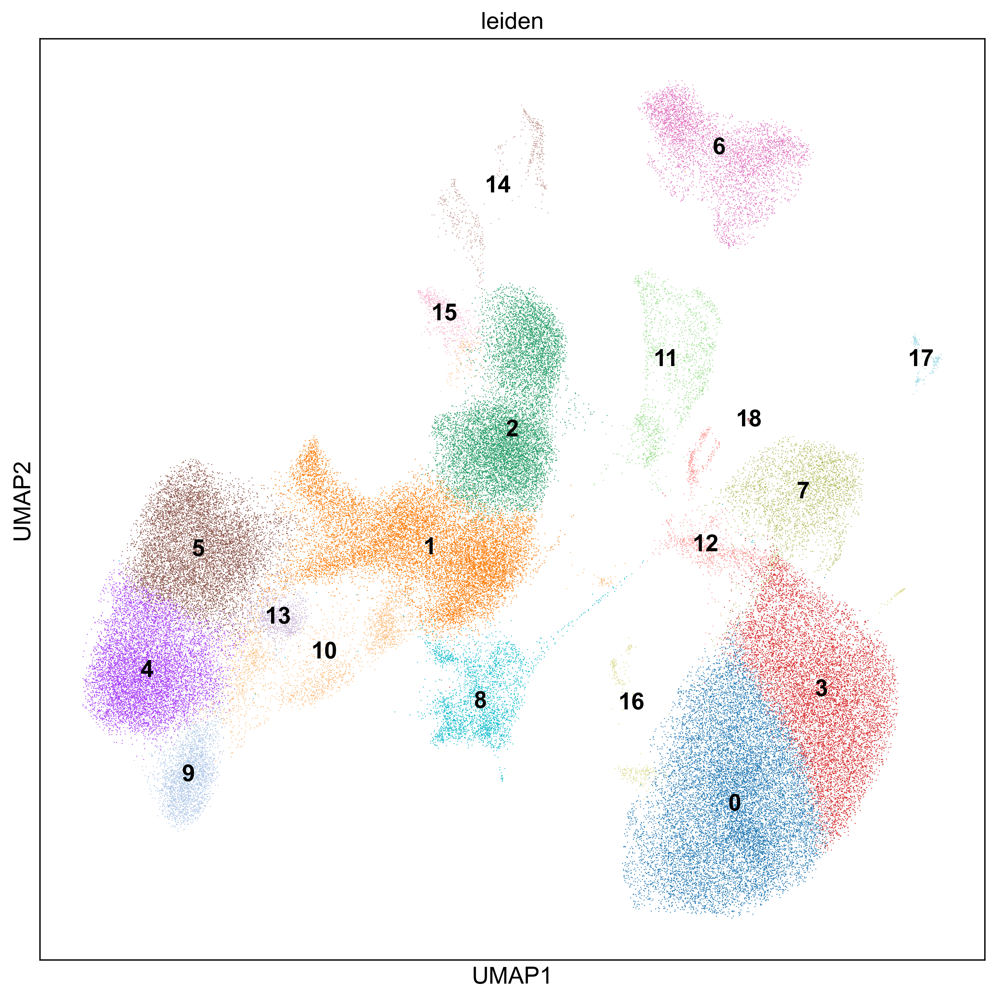

In [43]:
sc.settings.set_figure_params(dpi=200, figsize=(10, 10))
sc.pl.umap(integrated,color=['leiden'],legend_loc='on data')

In [44]:
sc.tl.leiden(integrated,resolution=0.4)

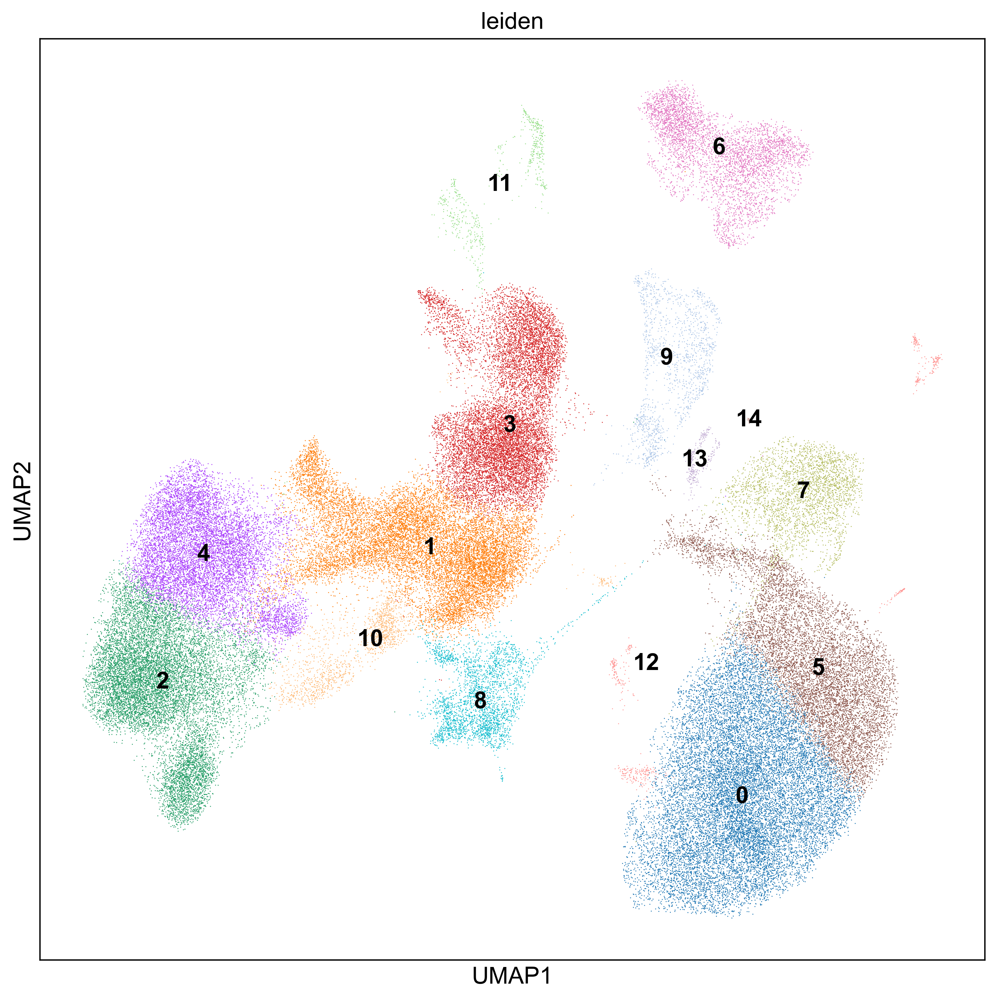

In [45]:
sc.settings.set_figure_params(dpi=200, figsize=(10, 10))
sc.pl.umap(integrated,color=['leiden'],legend_loc='on data')

In [49]:
sc.tl.rank_genes_groups(integrated, 'leiden', method='wilcoxon')

In [50]:
result = integrated.uns['rank_genes_groups']
groups = result['names'].dtype.names
deg_data = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']})

In [54]:
deg_data['2_n'][0:30]

0       S100A8
1         VCAN
2         FCN1
3          LYZ
4         CTSS
5       S100A9
6         MNDA
7       TYROBP
8      S100A12
9          FTL
10        CST3
11        AIF1
12       CSF3R
13       IFI30
14        CD14
15        CYBB
16        PSAP
17      S100A6
18        LST1
19     S100A11
20        TYMP
21       NEAT1
22    SERPINA1
23        TSPO
24      S100A4
25         GRN
26        CSTA
27      MS4A6A
28        FTH1
29        FPR1
Name: 2_n, dtype: object